In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

plt.style.use('seaborn')
# plt.style.use('seaborn-colorblind') #alternative
plt.rcParams['figure.figsize'] = [16, 9]
plt.rcParams['figure.dpi'] = 200
warnings.simplefilter(action='ignore', category=FutureWarning)

In [3]:
%load_ext watermark

# Time Series Modeling

## Decomposing time series

### How to do it...

1. Import the libraries:

In [4]:
import pandas as pd
import quandl
from statsmodels.tsa.seasonal import seasonal_decompose

In [5]:
%watermark --iversions

pandas   0.24.2
json     2.0.9
seaborn  0.9.0
numpy    1.16.4
autopep8 1.4.4



2. Download the prices of gold for years 2000-2011 and resample to monthly values:

In [6]:
QUANDL_KEY = '{key}' # replace {key} with your own API key  
QUANDL_KEY = 'zs7xyLhXJbVU_Sk2-4aB'
quandl.ApiConfig.api_key = QUANDL_KEY

df = quandl.get(dataset='WGC/GOLD_MONAVG_USD',
                start_date='2000-01-01', 
                end_date='2011-12-31')

df.rename(columns={'Value': 'gold_price'}, inplace=True)
df = df.resample("M").last()

In [7]:
print(f'Shape of DataFrame: {df.shape}')
df.head()

Shape of DataFrame: (144, 1)


,gold_price
Date,
2000-01-31,284.31
2000-02-29,299.86
2000-03-31,286.39
2000-04-30,279.69
2000-05-31,275.19


3. Add rolling mean and standard deviation:

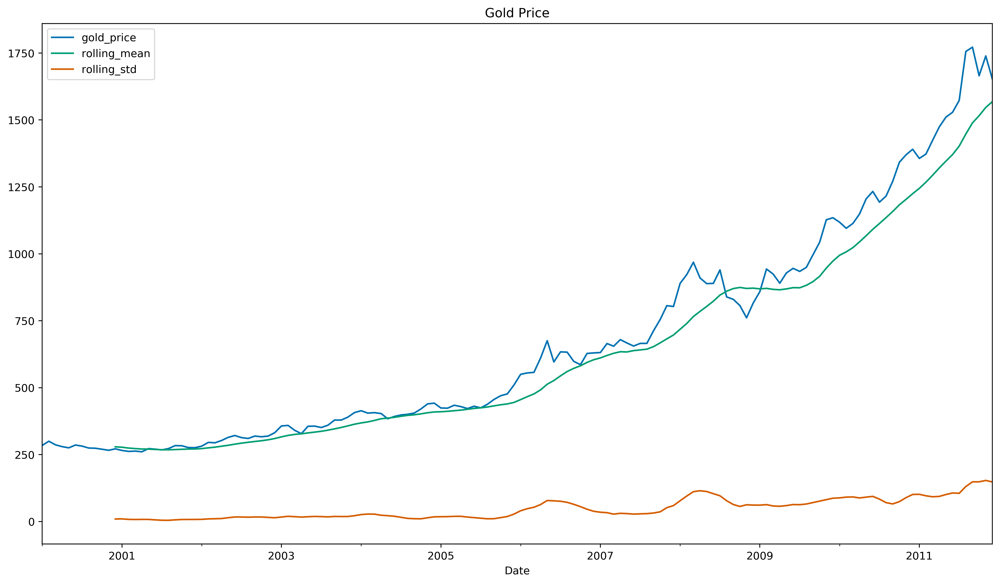

In [8]:
WINDOW_SIZE = 12
df['rolling_mean'] = df.gold_price.rolling(window=WINDOW_SIZE).mean()
df['rolling_std'] = df.gold_price.rolling(window=WINDOW_SIZE).std()
df.plot(title='Gold Price');

4. Carry out seasonal decomposition using the multiplicative model:

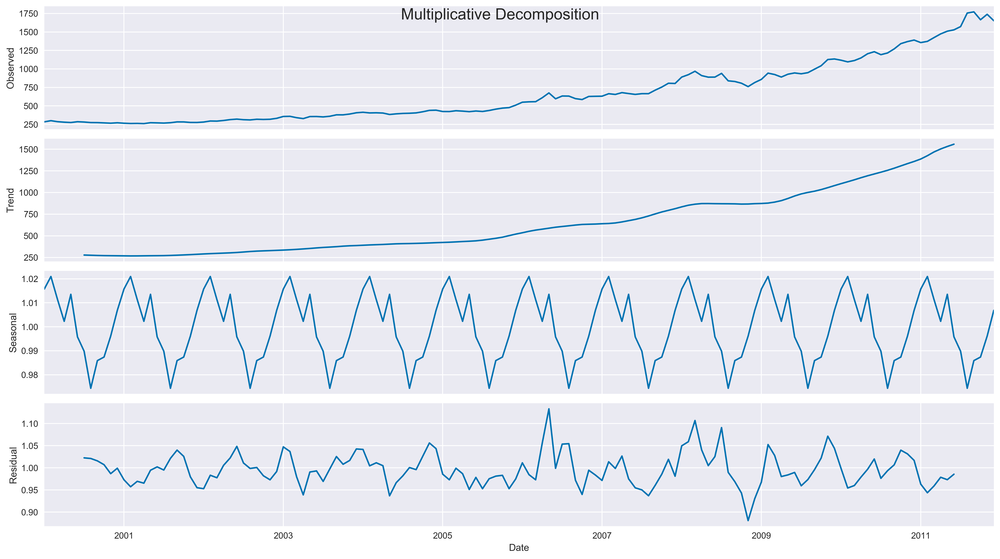

In [12]:
decomposition_results = seasonal_decompose(df.gold_price, 
                                           model='multiplicative')
decomposition_results.plot() \
                     .suptitle('Multiplicative Decomposition', 
                               fontsize=18);

## Decomposing time series using Facebook's Prophet

### How to do it...

1. Import the libraries and authenticate with Quandl:

In [13]:
import pandas as pd
import quandl
from fbprophet import Prophet

QUANDL_KEY = '{key}' # replace {key} with your own API key 
QUANDL_KEY = 'zs7xyLhXJbVU_Sk2-4aB'
quandl.ApiConfig.api_key = QUANDL_KEY

2. Download the daily gold prices and rename the columns:

In [14]:
df = quandl.get(dataset='WGC/GOLD_DAILY_USD',
                start_date='2000-01-01',
                end_date='2005-12-31')

df.reset_index(drop=False, inplace=True)
df.rename(columns={'Date': 'ds', 'Value': 'y'}, inplace=True)

3. Split the series into the training and test sets:

In [15]:
train_indices = df.ds.apply(lambda x: x.year).values < 2005
df_train = df.loc[train_indices].dropna()
df_test = df.loc[~train_indices].reset_index(drop=True)

4. Create the instance of the model and fit it to the data:

In [16]:
model_prophet = Prophet(seasonality_mode='additive')
model_prophet.add_seasonality(name='monthly', period=30.5, fourier_order=5)
model_prophet.fit(df_train)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


5. Forecast the gold prices 1 year ahead and plot the results:

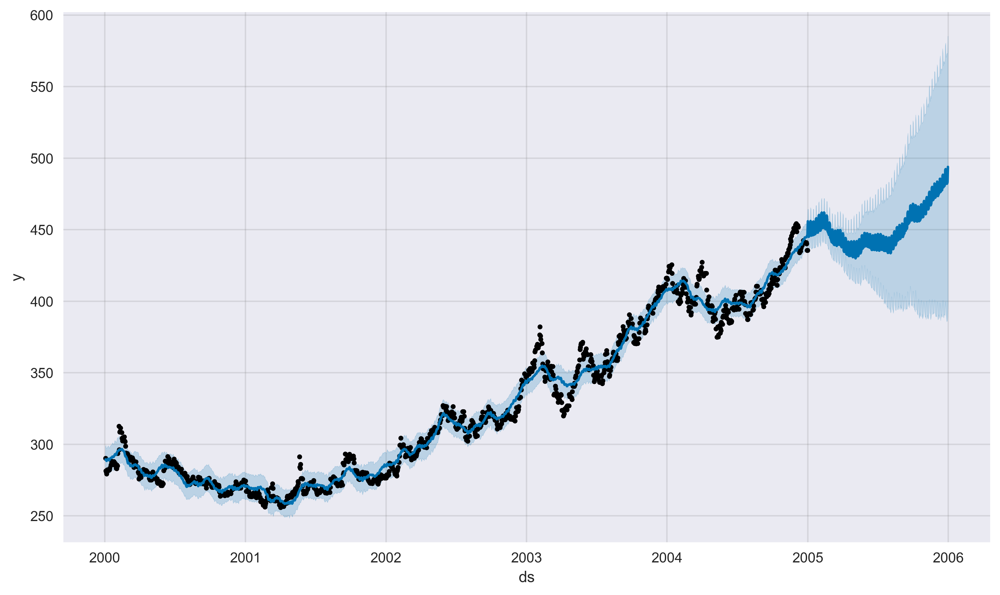

In [17]:
df_future = model_prophet.make_future_dataframe(periods=365)
df_pred = model_prophet.predict(df_future)
model_prophet.plot(df_pred);

6. Inspect the decomposition of the time series:

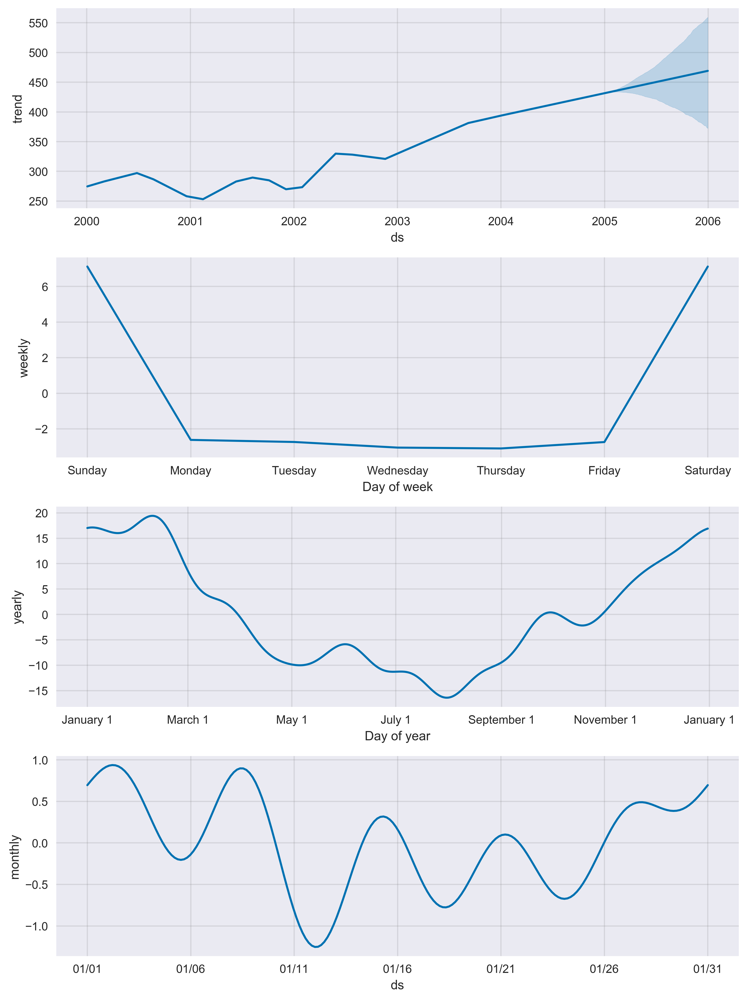

In [18]:
model_prophet.plot_components(df_pred);

### There's more...

1. Merge the test set with the forecasts:

In [19]:
SELECTED_COLUMNS = ['ds', 'yhat_lower', 'yhat_upper', 'yhat']

df_pred = df_pred.loc[:, SELECTED_COLUMNS].reset_index(drop=True)
df_test = df_test.merge(df_pred, on=['ds'], how='left')
df_test.ds = pd.to_datetime(df_test.ds)
df_test.set_index('ds', inplace=True)

2. Plot the test values vs. predictions:

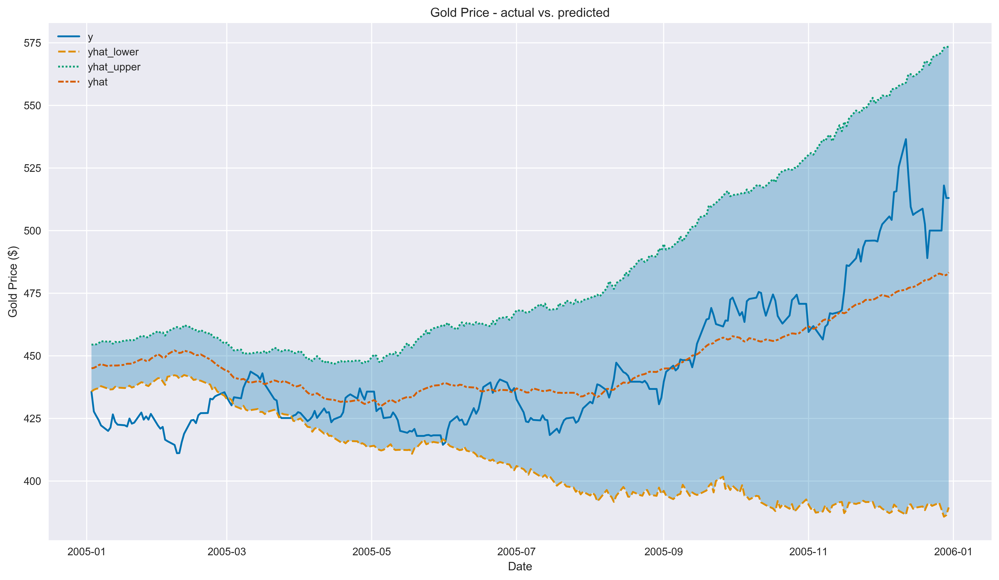

In [20]:
fig, ax = plt.subplots(1, 1)

ax = sns.lineplot(data=df_test[['y', 'yhat_lower', 'yhat_upper', 'yhat']])
ax.fill_between(df_test.index,
                df_test.yhat_lower,
                df_test.yhat_upper,
                alpha=0.3)
ax.set(title='Gold Price - actual vs. predicted',
       xlabel='Date',
       ylabel='Gold Price ($)');

## Testing for stationarity in time series

### How to do it...

0: Download the data:

In [21]:
import pandas as pd
import quandl

In [22]:
QUANDL_KEY = '{key}' # replace {key} with your own API key  
QUANDL_KEY = 'zs7xyLhXJbVU_Sk2-4aB'
quandl.ApiConfig.api_key = QUANDL_KEY

df = quandl.get(dataset='WGC/GOLD_MONAVG_USD',
                start_date='2000-01-01', 
                end_date='2011-12-31')

df.rename(columns={'Value': 'gold_price'}, inplace=True)
df = df.resample("M").last()

1. Import the libraries:

In [23]:
import pandas as pd
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller, kpss

2. Define a function for running the ADF test:

In [24]:
def adf_test(x):
    '''
    Function for performing the Augmented Dickey-Fuller test for stationarity
    
    Null Hypothesis: time series is not stationary
    Alternate Hypothesis: time series is stationary

    Parameters
    ------------
    x : pd.Series / np.array
        The time series to be checked for stationarity
    
    Returns
    ------------
    results: pd.DataFrame
        A DataFrame with the ADF test's results
    '''
    
    indices = ['Test Statistic', 'p-value',
               '# of Lags Used', '# of Observations Used']
    
    adf_test = adfuller(x, autolag='AIC')
    results = pd.Series(adf_test[0:4], index=indices)
    
    for key, value in adf_test[4].items():
        results[f'Critical Value ({key})'] = value

    return results


In [25]:
adf_test(df.gold_price)

Test Statistic              3.510499
p-value                     1.000000
# of Lags Used             14.000000
# of Observations Used    129.000000
Critical Value (1%)        -3.482088
Critical Value (5%)        -2.884219
Critical Value (10%)       -2.578864
dtype: float64

3. Define a function for running the KPSS test:

In [26]:
def kpss_test(x, h0_type='c'):
    '''
    Function for performing the Kwiatkowski-Phillips-Schmidt-Shin test for stationarity

    Null Hypothesis: time series is stationary
    Alternate Hypothesis: time series is not stationary

    Parameters
    ------------
    x: pd.Series / np.array
        The time series to be checked for stationarity
    h0_type: str{'c', 'ct'}
        Indicates the null hypothesis of the KPSS test:
            * 'c': The data is stationary around a constant(default)
            * 'ct': The data is stationary around a trend
    
    Returns
    ------------
    results: pd.DataFrame
        A DataFrame with the KPSS test's results
    '''
    
    indices = ['Test Statistic', 'p-value', '# of Lags']

    kpss_test = kpss(x, regression=h0_type)
    results = pd.Series(kpss_test[0:3], index=indices)
    
    for key, value in kpss_test[3].items():
        results[f'Critical Value ({key})'] = value

    return results

In [27]:
kpss_test(df.gold_price)

/Users/eryklewinson/anaconda3/envs/chapter_3/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:1276: InterpolationWarning:

p-value is smaller than the indicated p-value



Test Statistic            0.985671
p-value                   0.010000
# of Lags                14.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64

4. Generate the ACF/PACF plots:

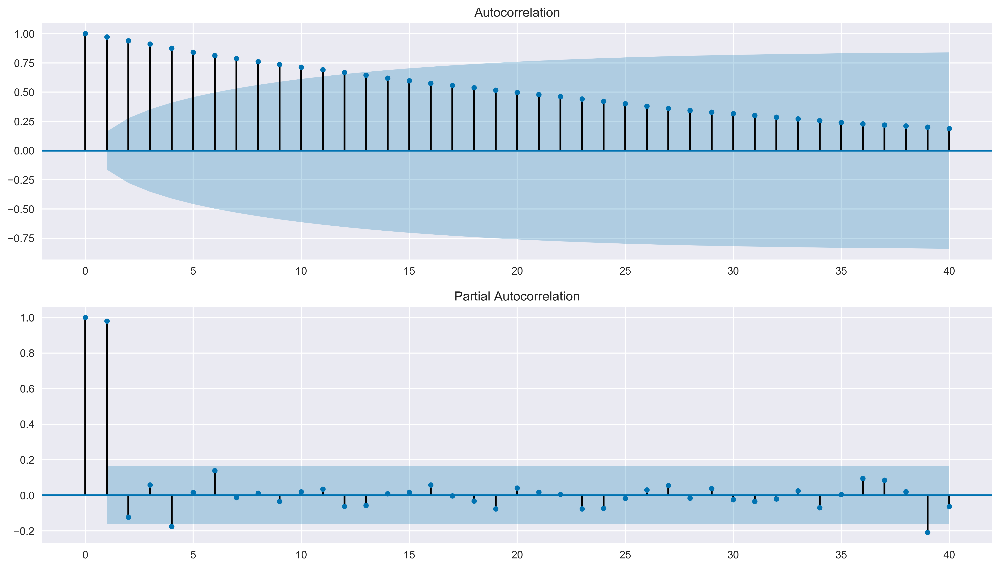

In [28]:
N_LAGS = 40
SIGNIFICANCE_LEVEL = 0.05

fig, ax = plt.subplots(2, 1)
plot_acf(df.gold_price, ax=ax[0], lags=N_LAGS, alpha=SIGNIFICANCE_LEVEL)
plot_pacf(df.gold_price, ax=ax[1], lags=N_LAGS, alpha=SIGNIFICANCE_LEVEL);

## Correcting for stationarity in time series

### How to do it...

0: Download the data:

In [6]:
import pandas as pd
import quandl

In [7]:
QUANDL_KEY = '{key}' # replace {key} with your own API key  
QUANDL_KEY = 'zs7xyLhXJbVU_Sk2-4aB'
quandl.ApiConfig.api_key = QUANDL_KEY

df = quandl.get(dataset='WGC/GOLD_MONAVG_USD',
                start_date='2000-01-01', 
                end_date='2011-12-31')

df.rename(columns={'Value': 'gold_price'}, inplace=True)
df = df.resample("M").last()

1. Import the libraries and update the inflation data:

In [8]:
import cpi
import pandas as pd
from datetime import date
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller, kpss
from chapter_3_utils import test_autocorrelation

# update the CPI data (if needed)
#cpi.update()

/Users/eryklewinson/anaconda3/lib/python3.7/site-packages/cpi/__init__.py:46: StaleDataWarning: CPI data is out of date. To accurately inflate to today's dollars, you must run `cpi.update()`.
  warnings.warn(StaleDataWarning())


2. Deflate the gold prices (to 2011-12-31 USD values) and plot the results:

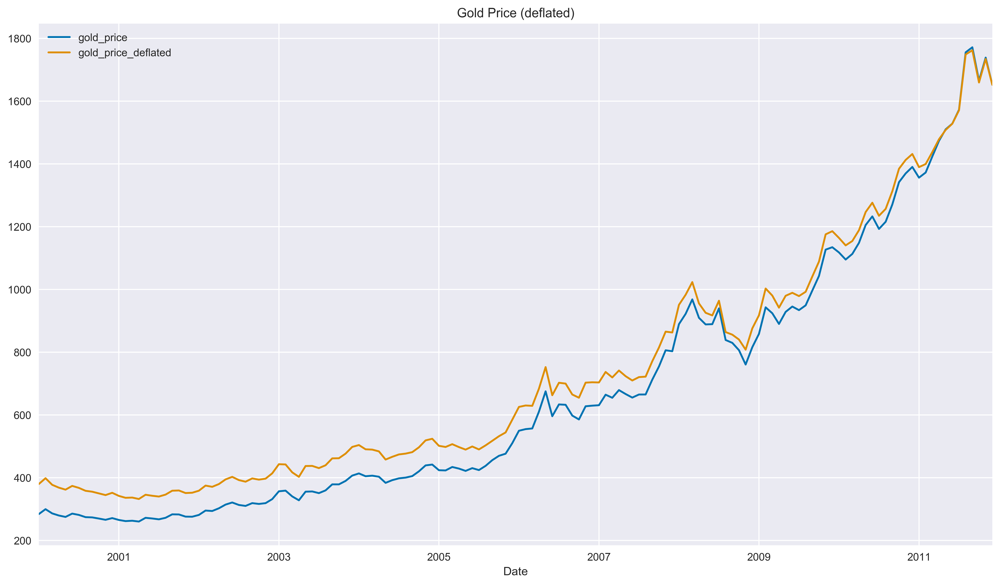

In [12]:
DEFL_DATE = date(2011, 12, 31)

df['dt_index'] = df.index.map(lambda x: x.to_pydatetime().date())
df['gold_price_deflated'] = df.apply(lambda x: cpi.inflate(x.gold_price,
                                                           x.dt_index, 
                                                           DEFL_DATE), 
                                     axis=1)
df[['gold_price', 'gold_price_deflated']].plot(title='Gold Price (deflated)');

3. Deflate the series using natural logarithm and plot it together with the rolling metrics:

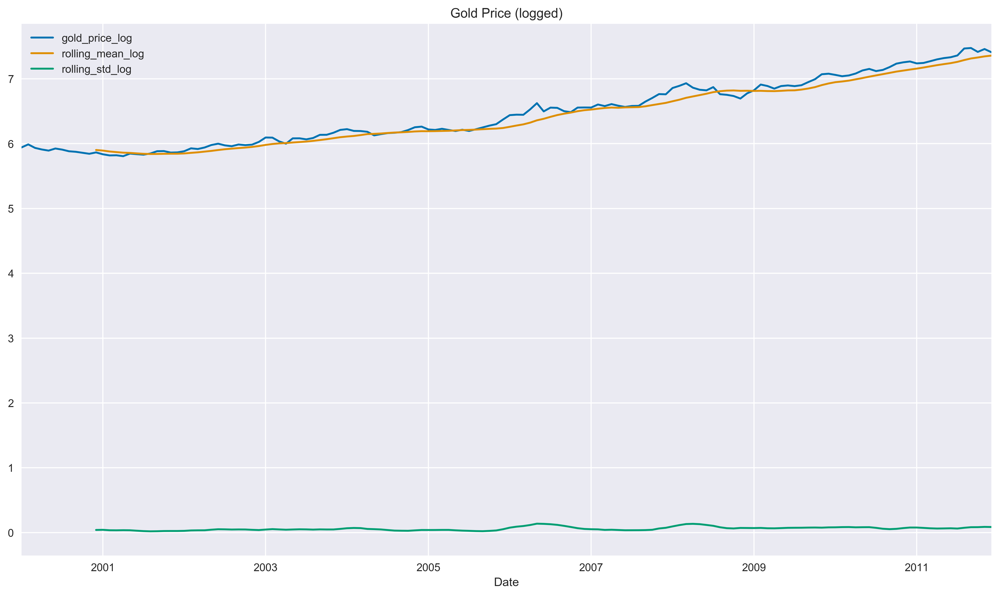

In [13]:
WINDOW_SIZE = 12
SELECTED_COLUMNS = ['gold_price_log', 'rolling_mean_log', 
                    'rolling_std_log']

df['gold_price_log'] = np.log(df.gold_price_deflated)
df['rolling_mean_log'] = df.gold_price_log.rolling(window=WINDOW_SIZE) \
                           .mean()
df['rolling_std_log'] = df.gold_price_log.rolling(window=WINDOW_SIZE) \
                          .std()

df[SELECTED_COLUMNS].plot(title='Gold Price (logged)');

4. Use the `test_autocorrelation` (helper function for this chapter) to investigate if the series became stationary"

ADF test statistic: 0.89 (p-val: 0.99)
KPSS test statistic: 1.04 (p-val: 0.01)


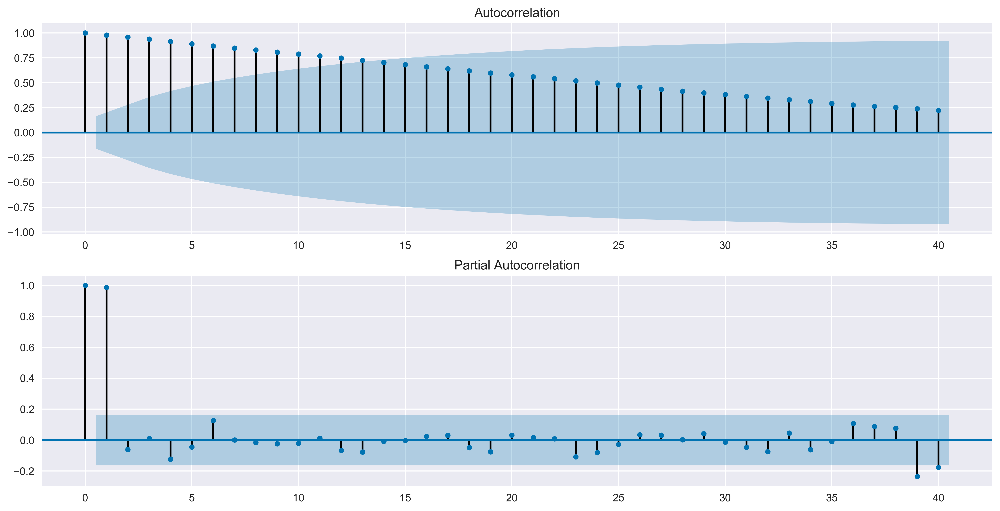

In [14]:
test_autocorrelation(df.gold_price_log)

5. Apply differencing to the series and plot the results:

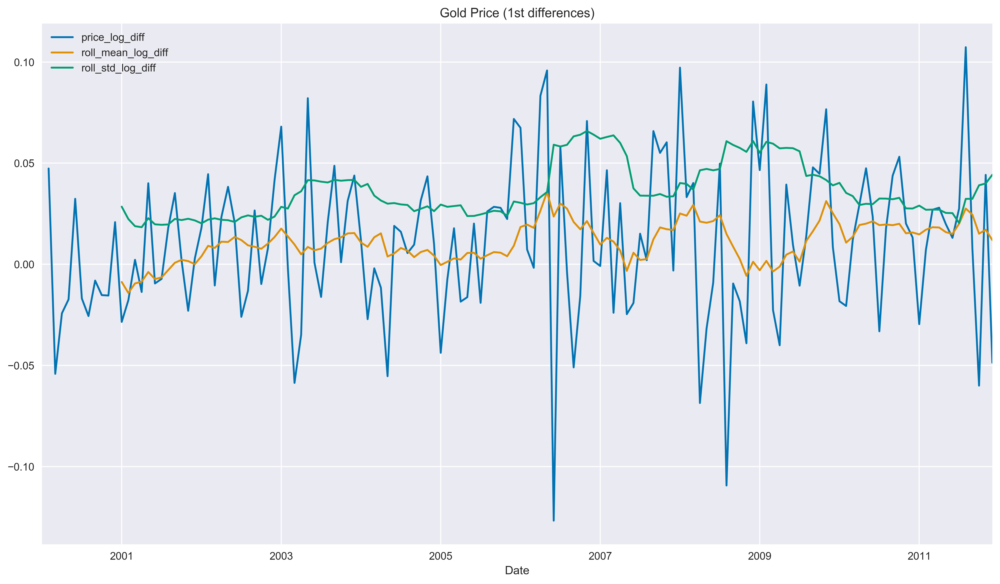

In [15]:
SELECTED_COLUMNS = ['price_log_diff', 'roll_mean_log_diff', 
                    'roll_std_log_diff']

df['price_log_diff'] = df.gold_price_log.diff(1)
df['roll_mean_log_diff'] = df.price_log_diff.rolling(window=WINDOW_SIZE) \
                             .mean()
df['roll_std_log_diff'] = df.price_log_diff.rolling(window=WINDOW_SIZE) \
                            .std()
df[SELECTED_COLUMNS].plot(title='Gold Price (1st differences)');

6. Test if the series became stationary:

ADF test statistic: -9.13 (p-val: 0.00)
KPSS test statistic: 0.37 (p-val: 0.09)


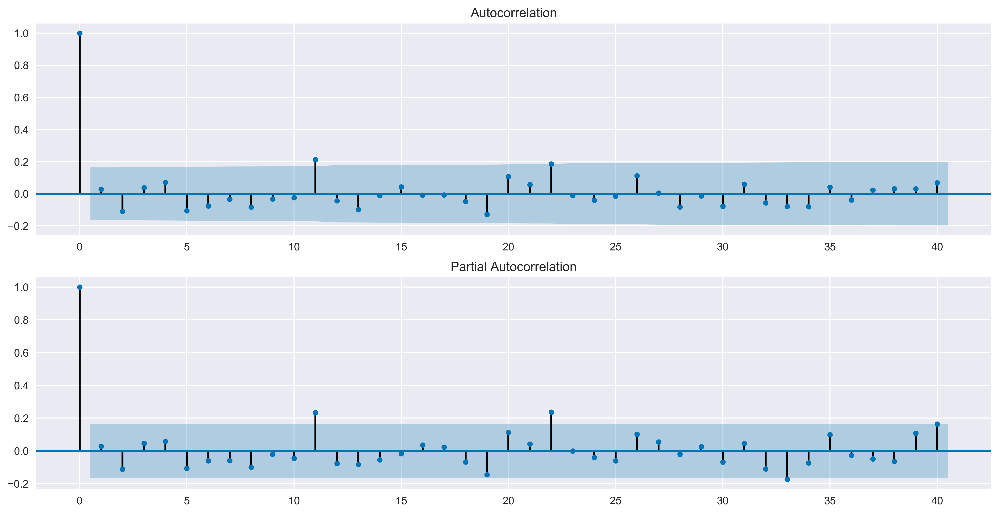

In [17]:
test_autocorrelation(df.price_log_diff.dropna())

### There's more...

In [18]:
from pmdarima.arima import ndiffs, nsdiffs

In [19]:
print(f"Suggested # of differences (ADF): {ndiffs(df.gold_price, test='adf')}")
print(f"Suggested # of differences (KPSS): {ndiffs(df.gold_price, test='kpss')}")
print(f"Suggested # of differences (PP): {ndiffs(df.gold_price, test='pp')}")

Suggested # of differences (ADF): 1
Suggested # of differences (KPSS): 2
Suggested # of differences (PP): 1


In [20]:
print(f"Suggested # of differences (OSCB): {nsdiffs(df.gold_price, m=12, test='ocsb')}")
print(f"Suggested # of differences (CH): {nsdiffs(df.gold_price, m=12, test='ch')}")

Suggested # of differences (OSCB): 0
Suggested # of differences (CH): 0


## Modeling time series with exponential smoothing methods

### How to do it...

1. Import the libraries:

In [6]:
import pandas as pd
import numpy as np
import yfinance as yf
from datetime import date
from statsmodels.tsa.holtwinters import (ExponentialSmoothing, 
                                         SimpleExpSmoothing, 
                                         Holt)

2. Download the adjusted stock prices of Google:

In [7]:
df = yf.download('GOOG',
                 start='2010-01-01',
                 end='2018-12-31',
                 adjusted=True,
                 progress=False)

print(f'Downloaded {df.shape[0]} rows of data.')

Downloaded 2264 rows of data.


3. Aggregate to monthly frequency:

In [8]:
goog = df.resample('M') \
         .last() \
         .rename(columns={'Adj Close': 'adj_close'}) \
         .adj_close 

4. Create the training/test split:

In [9]:
train_indices = goog.index.year < 2018
goog_train = goog[train_indices]
goog_test = goog[~train_indices]

TEST_LENGTH = len(goog_test)

5. Plot the prices:

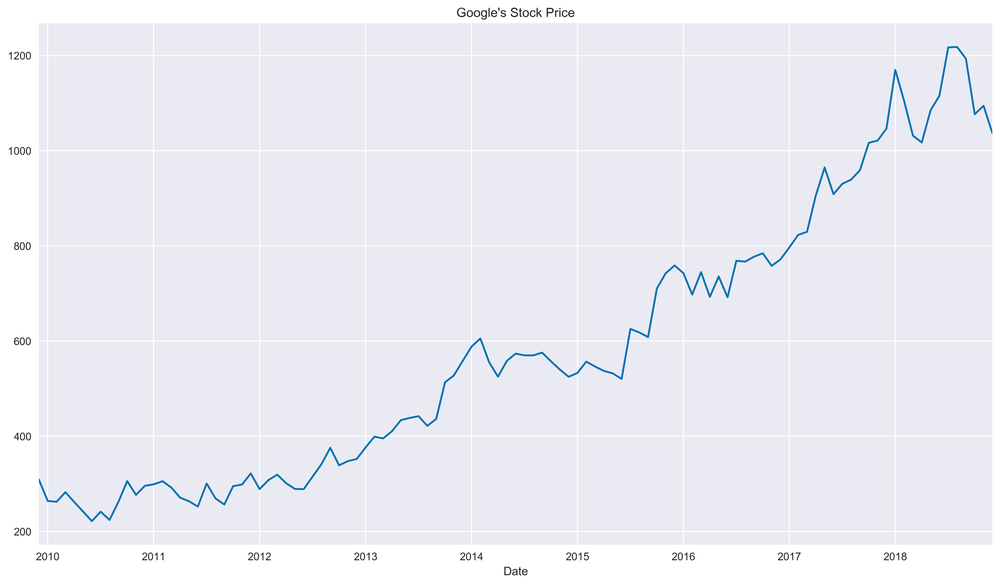

In [10]:
goog.plot(title="Google's Stock Price");

6. Fit 3 Simple Exponential Smoothing models and create forecasts:

In [11]:
ses_1 = SimpleExpSmoothing(goog_train).fit(smoothing_level=0.2)
ses_forecast_1 = ses_1.forecast(TEST_LENGTH)

ses_2 = SimpleExpSmoothing(goog_train).fit(smoothing_level=0.5)
ses_forecast_2 = ses_2.forecast(TEST_LENGTH)

ses_3 = SimpleExpSmoothing(goog_train).fit()
alpha = ses_3.model.params['smoothing_level']
ses_forecast_3 = ses_3.forecast(TEST_LENGTH)

7. Plot the original prices together with the models' results:

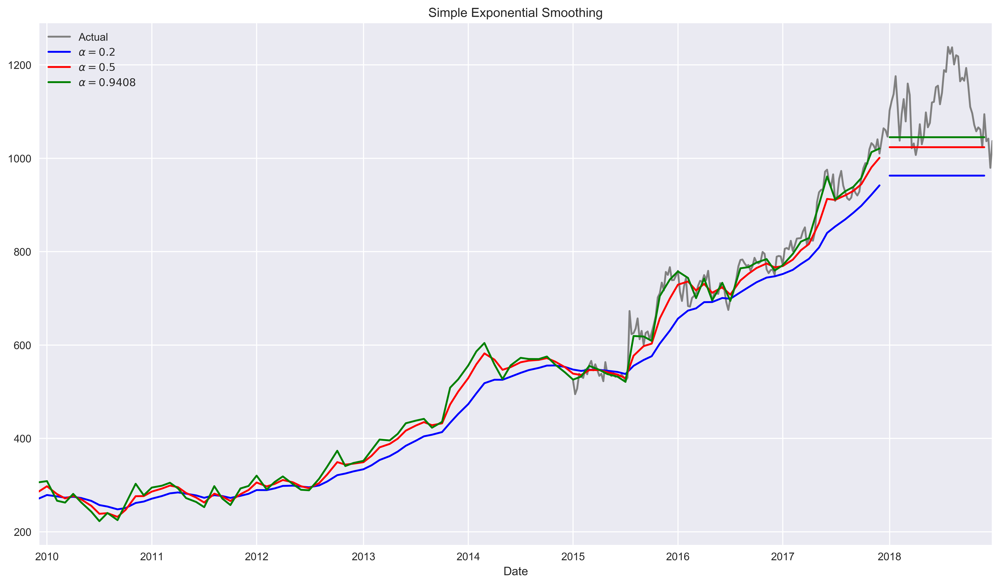

In [40]:
goog.plot(color='gray', 
          title='Simple Exponential Smoothing',
          label='Actual',
          legend=True)

ses_forecast_1.plot(color='blue', legend=True, 
                    label=r'$\alpha=0.2$')
ses_1.fittedvalues.plot(color='blue')

ses_forecast_2.plot(color='red', legend=True, 
                    label=r'$\alpha=0.5$')
ses_2.fittedvalues.plot(color='red')

ses_forecast_3.plot(color='green', legend=True, 
                    label=r'$\alpha={0:.4f}$'.format(alpha))
ses_3.fittedvalues.plot(color='green');


8. Fit 3 variants of the Holt's Smoothing models and create forecasts:

In [13]:
# Holt's model with linear trend
hs_1 = Holt(goog_train).fit()
hs_forecast_1 = hs_1.forecast(TEST_LENGTH)

# Holt's model with exponential trend
hs_2 = Holt(goog_train, exponential=True).fit()
# equivalent to ExponentialSmoothing(goog_train, trend='mul').fit()
hs_forecast_2 = hs_2.forecast(TEST_LENGTH)

# Holt's model with exponential trend and damping
hs_3 = Holt(goog_train, exponential=False, damped=True).fit(damping_slope=0.99)
hs_forecast_3 = hs_3.forecast(TEST_LENGTH)

9. Plot the original prices together with the models' results:

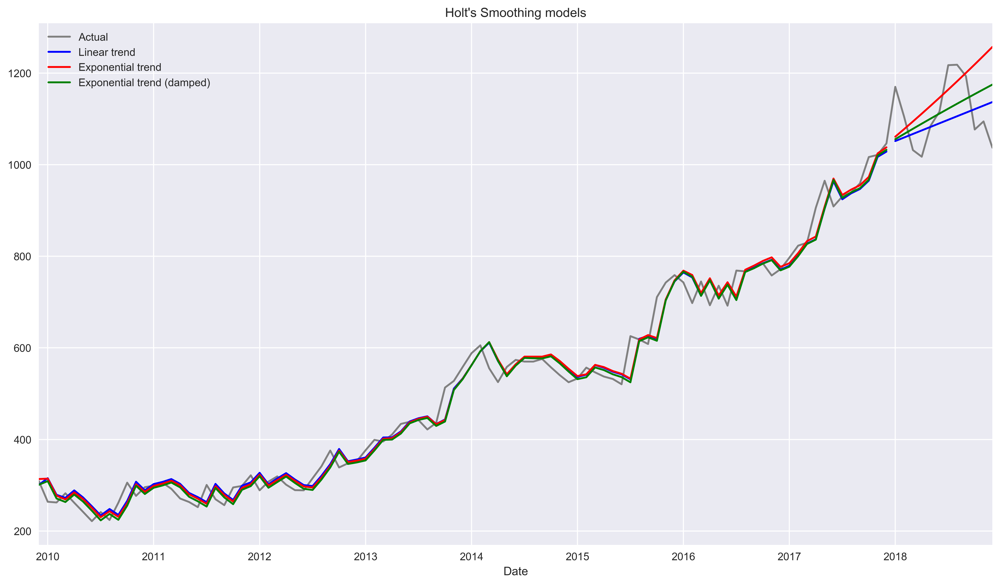

In [14]:
goog.plot(color='gray',
          title="Holt's Smoothing models",
          label='Actual',
          legend=True)

hs_1.fittedvalues.plot(color='blue')
hs_forecast_1.plot(color='blue', legend=True, 
                   label='Linear trend')

hs_2.fittedvalues.plot(color='red')
hs_forecast_2.plot(color='red', legend=True, 
                   label='Exponential trend')

hs_3.fittedvalues.plot(color='green')
hs_forecast_3.plot(color='green', legend=True, 
                   label='Exponential trend (damped)');

### There's more...

In [15]:
SEASONAL_PERIODS = 12

# Holt-Winter's model with exponential trend
hw_1 = ExponentialSmoothing(goog_train, 
                            trend='mul', 
                            seasonal='add', 
                            seasonal_periods=SEASONAL_PERIODS).fit()
hw_forecast_1 = hw_1.forecast(TEST_LENGTH)

# Holt-Winter's model with exponential trend and damping
hw_2 = ExponentialSmoothing(goog_train, 
                            trend='mul', 
                            seasonal='add', 
                            seasonal_periods=SEASONAL_PERIODS, 
                            damped=True).fit()
hw_forecast_2 = hw_2.forecast(TEST_LENGTH)

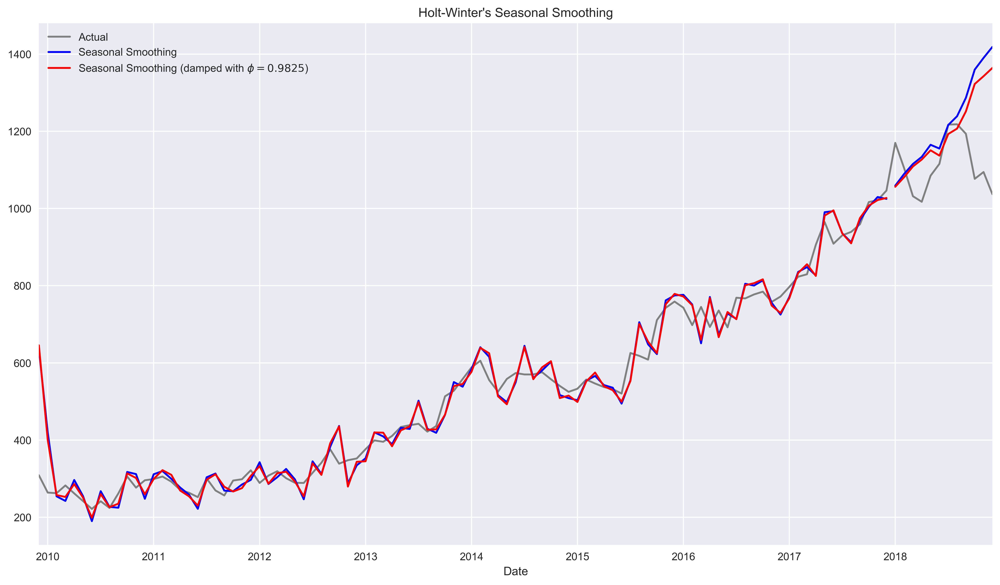

In [16]:
goog.plot(color='gray',
          title="Holt-Winter's Seasonal Smoothing",
          label='Actual',
          legend=True)

hw_1.fittedvalues.plot(color='blue')
hw_forecast_1.plot(color='blue', legend=True, 
                   label='Seasonal Smoothing')

phi = hw_2.model.params['damping_slope']
plot_label = f'Seasonal Smoothing (damped with $\phi={phi:.4f}$)'

hw_2.fittedvalues.plot(color='red')
hw_forecast_2.plot(color='red', legend=True, 
                   label=plot_label);

## Modeling time series with ARIMA class models

### How to do it...

1. Import the libraries:

In [17]:
import yfinance as yf
import pandas as pd
import numpy as np
from statsmodels.tsa.arima_model import ARIMA
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.stats.diagnostic import acorr_ljungbox
import scipy.stats as scs
from chapter_3_utils import test_autocorrelation

In [18]:
%watermark --iversions

json     2.0.9
yfinance 0.1.42
pandas   0.24.2
numpy    1.16.4
seaborn  0.9.0
autopep8 1.4.4



2. Download Google's stock prices and resample to weekly frequency:

In [19]:
df = yf.download('GOOG',
                 start='2015-01-01',
                 end='2018-12-31',
                 adjusted=True,
                 progress=False)

goog = df.resample('W') \
         .last() \
         .rename(columns={'Adj Close': 'adj_close'}) \
         .adj_close 

3. Apply the first differences to the price series and plot them together:

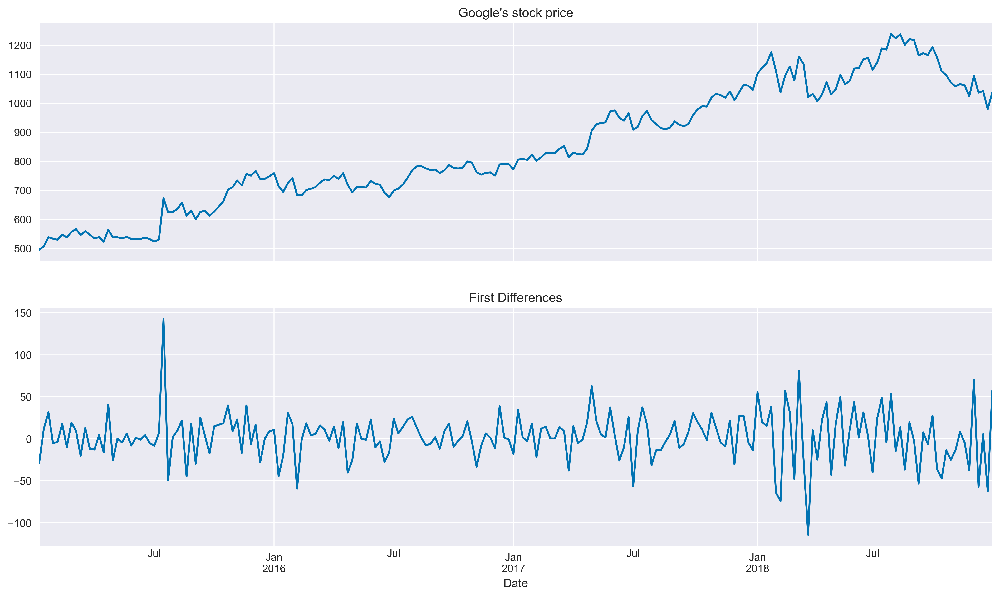

In [24]:
goog_diff = goog.diff().dropna()

fig, ax = plt.subplots(2, sharex=True)
goog.plot(title = "Google's stock price", ax=ax[0])
goog_diff.plot(ax=ax[1], title='First Differences');

4. Test the differenced series for stationarity:

ADF test statistic: -12.79 (p-val: 0.00)
KPSS test statistic: 0.11 (p-val: 0.10)


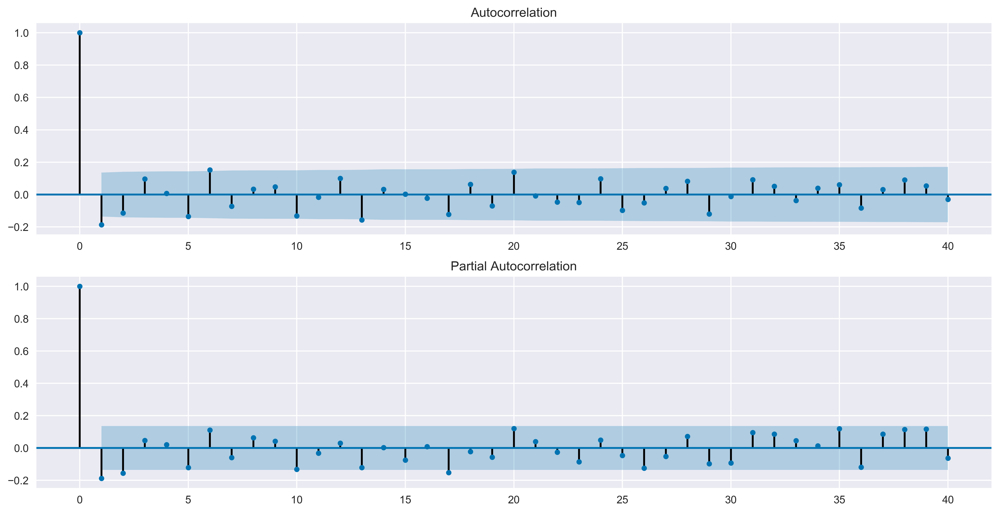

In [25]:
test_autocorrelation(goog_diff)

5. Based on the results of the tests, specify the ARIMA model and fit it to the data:

In [26]:
arima = ARIMA(goog, order=(2, 1, 1)).fit(disp=0)
arima.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:            D.adj_close   No. Observations:                  208
Model:                 ARIMA(2, 1, 1)   Log Likelihood                -987.233
Method:                       css-mle   S.D. of innovations             27.859
Date:                Mon, 02 Dec 2019   AIC                           1984.466
Time:                        20:06:16   BIC                           2001.154
Sample:                    01-11-2015   HQIC                          1991.214
                         - 12-30-2018                                         
=====================================================================================
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 2.4700      1.441      1.714      0.088      -0.354       5.294
ar.L1.D.adj_close    -0.3908      0.280     -1.398      0.164      -0.939       0.157
ar.L2.D.adj_close    -0.1910      0.082     -2.322      0.021      -0.352      -0.030
ma.L1.D.adj_close     0.1781      0.280      0.637      0.525      -0.370       0.726
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1           -1.0233           -2.0467j            2.2883           -0.3238
AR.2           -1.0233           +2.0467j            2.2883            0.3238
MA.1           -5.6163           +0.0000j            5.6163            0.5000
-----------------------------------------------------------------------------
"""

6. Prepare a function for diagnosing the fit of the model based on its residuals:

In [27]:
def arima_diagnostics(arima_model, time_index=None):
    '''
    Function for diagnosing the fit of an ARIMA model by investigating the residuals.
    
    Parameters
    ------------
    arima_model : statsmodels.tsa.arima.ARIMAResults
        Fitted ARIMA model from statsmodels
    time_index : list/array-like
        A list of dates for the x-axis in the plot of residuals over time 
    '''
     
    # create placeholder subplots
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2)

    # residuals over time
    n_resids = len(arima.resid)   
    time_index = range(n_resids) if time_index is None else time_index
    sns.lineplot(x=time_index, y=arima.resid, ax=ax1)
    ax1.set_title('Residuals', fontsize=14)

    # distribution of residuals
    r_range = np.linspace(min(arima.resid), max(arima.resid), num=1000)
    norm_pdf = scs.norm.pdf(r_range, loc=0, scale=1)
    
    sns.distplot(arima.resid, hist=True, kde=False, norm_hist=True, ax=ax2)
    ax2.plot(r_range, norm_pdf, 'g', lw=2, label='N(0,1)')
    ax2.set_title('Distribution of residuals', fontsize=14)
    ax2.legend()
        
    # Q-Q plot
    qq = sm.qqplot(arima.resid, line='s', ax=ax3)
    ax3.set_title('Q-Q plot', fontsize=14)

    # ACF plot
    plot_acf(arima.resid, ax=ax4, lags=40, alpha=0.05)
    ax4.set_title('ACF plot', fontsize=14)

    return fig

7. Test the residuals of the fitted ARIMA model:

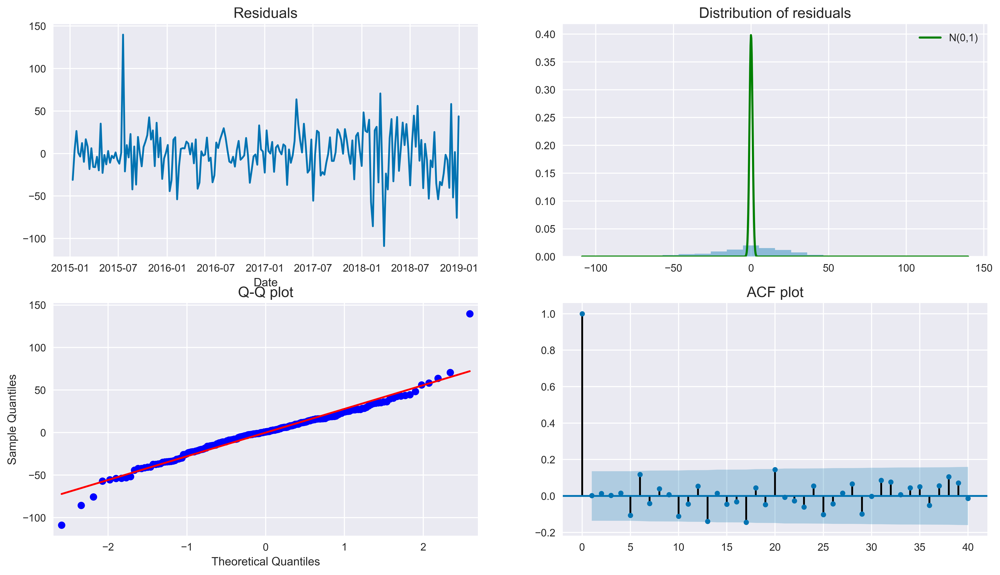

In [28]:
arima_diagnostics(arima, goog.index[1:]);

8. Apply the Ljung-Box's test for no autocorrelation in the residuals and plot the results:

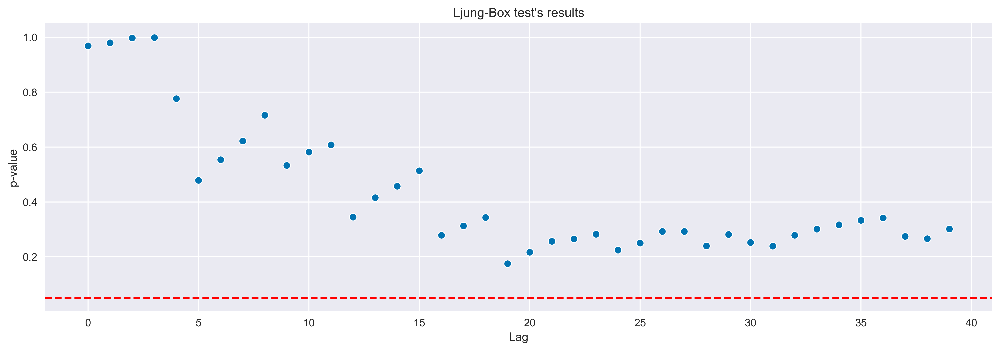

In [29]:
ljung_box_results = acorr_ljungbox(arima.resid)

fig, ax = plt.subplots(1, figsize=[16, 5])
sns.scatterplot(x=range(len(ljung_box_results[1])), 
                y=ljung_box_results[1], 
                ax=ax)
ax.axhline(0.05, ls='--', c='r')
ax.set(title="Ljung-Box test's results",
       xlabel='Lag',
       ylabel='p-value');

### There's more

1. We start by importing the library:

In [30]:
import pmdarima as pm

2. We run `auto_arima` with the majority of settings set to default values. We only exclude potential seasonality.

In [31]:
auto_arima = pm.auto_arima(goog, 
                           error_action='ignore',
                           suppress_warnings=True,
                           seasonal=False)
auto_arima.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:                    D.y   No. Observations:                  208
Model:                 ARIMA(0, 1, 1)   Log Likelihood                -988.749
Method:                       css-mle   S.D. of innovations             28.065
Date:                Mon, 02 Dec 2019   AIC                           1983.497
Time:                        20:06:53   BIC                           1993.510
Sample:                             1   HQIC                          1987.546
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          2.4561      1.486      1.653      0.100      -0.456       5.368
ma.L1.D.y     -0.2376      0.071     -3.339      0.001      -0.377      -0.098
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
MA.1            4.2096           +0.0000j            4.2096            0.0000
-----------------------------------------------------------------------------
"""

3. In the next step we try to tune the search of the optimal parameters:

In [32]:
auto_arima = pm.auto_arima(goog,
                           error_action='ignore',
                           suppress_warnings=True,
                           seasonal=False,
                           stepwise=False,
                           approximation=False,
                           n_jobs=-1)
auto_arima.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:                    D.y   No. Observations:                  208
Model:                 ARIMA(3, 1, 2)   Log Likelihood                -982.698
Method:                       css-mle   S.D. of innovations             27.235
Date:                Mon, 02 Dec 2019   AIC                           1979.397
Time:                        20:07:03   BIC                           2002.759
Sample:                             1   HQIC                          1988.843
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          2.4675      1.478      1.670      0.096      -0.429       5.364
ar.L1.D.y     -1.5445      0.124    -12.445      0.000      -1.788      -1.301
ar.L2.D.y     -1.1844      0.132     -8.982      0.000      -1.443      -0.926
ar.L3.D.y     -0.3043      0.072     -4.230      0.000      -0.445      -0.163
ma.L1.D.y      1.3587      0.116     11.731      0.000       1.132       1.586
ma.L2.D.y      0.7929      0.119      6.655      0.000       0.559       1.026
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1           -0.7904           -0.8927j            1.1924           -0.3653
AR.2           -0.7904           +0.8927j            1.1924            0.3653
AR.3           -2.3116           -0.0000j            2.3116           -0.5000
MA.1           -0.8567           -0.7261j            1.1230           -0.3881
MA.2           -0.8567           +0.7261j            1.1230            0.3881
-----------------------------------------------------------------------------
"""

## Forecasting using ARIMA class models

### How to do it...

1. Download additional test data and resample to weekly:

In [33]:
df = yf.download('GOOG',
                 start='2019-01-01',
                 end='2019-03-31',
                 adjusted=True,
                 progress=False)

print(f'Downloaded {df.shape[0]} rows of data.')

test = df.resample('W') \
         .last() \
         .rename(columns={'Adj Close': 'adj_close'}) \
         .adj_close 

Downloaded 62 rows of data.


2. Obtain forecasts from the first model and store them in a DataFrame:

In [34]:
N_FORECASTS = len(test)

arima_pred = arima.forecast(N_FORECASTS)

arima_pred = [pd.DataFrame(arima_pred[0], columns=['prediction']),
              pd.DataFrame(arima_pred[2], columns=['ci_lower', 
                                                   'ci_upper'])]
arima_pred = pd.concat(arima_pred, axis=1).set_index(test.index)

3. Obtain forecasts from the second model and store them in a DataFrame:

In [35]:
auto_arima_pred = auto_arima.predict(n_periods=N_FORECASTS, 
                                     return_conf_int=True, 
                                     alpha=0.05)


auto_arima_pred = [pd.DataFrame(auto_arima_pred[0], 
                                columns=['prediction']),
                   pd.DataFrame(auto_arima_pred[1], 
                                columns=['ci_lower', 'ci_upper'])]
auto_arima_pred = pd.concat(auto_arima_pred, axis=1).set_index(test.index)

4. Plot the results:

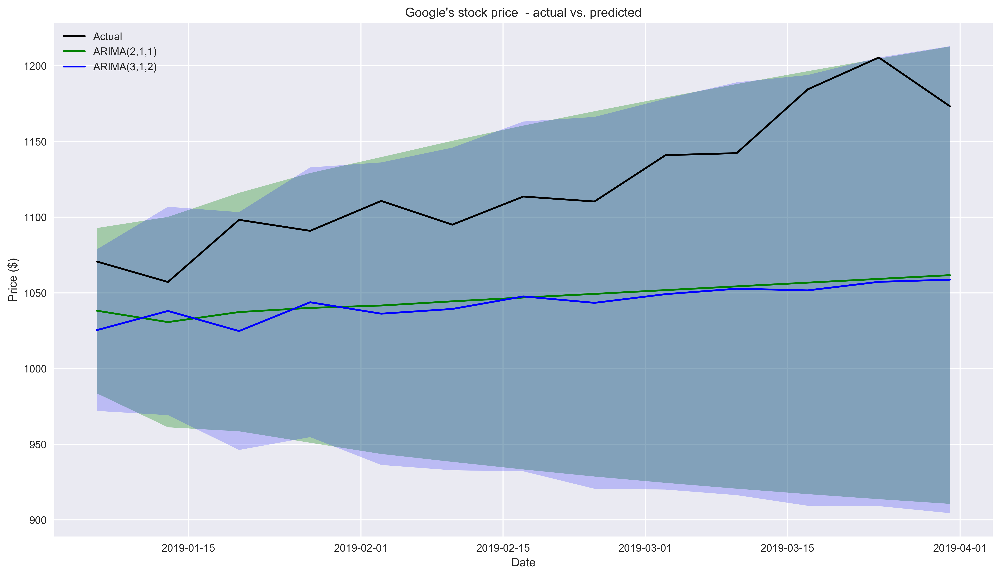

In [37]:
fig, ax = plt.subplots(1)

ax = sns.lineplot(data=test, color='k', label = 'Actual')

ax.plot(arima_pred.prediction, c='g', label = 'ARIMA(2,1,1)')
ax.fill_between(arima_pred.index,
                arima_pred.ci_lower,
                arima_pred.ci_upper,
                alpha=0.3, 
                facecolor='g')

ax.plot(auto_arima_pred.prediction, c='b', label = 'ARIMA(3,1,2)')
ax.fill_between(auto_arima_pred.index,
                auto_arima_pred.ci_lower,
                auto_arima_pred.ci_upper,
                alpha=0.2, 
                facecolor='b')

ax.set(title="Google's stock price  - actual vs. predicted", 
       xlabel='Date', 
       ylabel='Price ($)')
ax.legend();